# Style transfer using GAN
This notebook will be used to prepare the capstone project 'Style transfer using GAN'

In [1]:
#Import all the required libraries
import numpy as np
import os
from imageio import imread
import datetime
from skimage import io
from skimage.transform import resize
import keras
from keras import backend as K
import tensorflow as tf
import matplotlib.pyplot as plt
#% matplotlib inline

# To ensure the output tensors of all functions stay as type float64
tf.keras.backend.set_floatx('float64')


Using TensorFlow backend.


## Data understanding
Import the images & create two seperate datasets. The input shape for image should be (256, 256)


### The image size was reduced to 128x128 due to memory limitations of the machine

### The "image_dataset_from_directory" function didn't work in the available tensorflow edition. The images were read individually and converted to tensor

In [2]:
# Obtain current date and time to index the checkpoints
curr_dt_time = datetime.datetime.now()

# Fixing the size of the images to 128x128
img_height = 128
img_width = 128

file_list = os.listdir('dataset/Tr1/TrainT1')

# Function defined to read in the images

def get_data(path):
    data = np.zeros((len(file_list),img_height,img_width,1))
    for idx,item in enumerate(file_list):
        image = imread(path+'/'+file_list[idx])
        image = image.reshape(217,181,1)
        image = resize(image, (img_height,img_width,1), anti_aliasing=False)
        data[idx,:,:,0] = image[:,:,0]
    
    return data
  

In [3]:
# Importing Tr1 weighted images 
tr1 = tf.convert_to_tensor(get_data('dataset/Tr1/TrainT1'),dtype='float64') #write your code to create the dataset from image directory

/mnt/disks/user/anaconda3/lib/python3.7/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


In [4]:
# Importing Tr2 weighted images
tr2 = tf.convert_to_tensor(get_data('dataset/Tr2/TrainT2'),dtype='float64')#write your code to create the dataset from image directory

In [5]:
tr1

<tf.Tensor: shape=(43, 128, 128, 1), dtype=float64, numpy=
array([[[[0.00000000e+00],
         [0.00000000e+00],
         [1.31542729e-03],
         ...,
         [0.00000000e+00],
         [3.92156863e-03],
         [3.92156863e-03]],

        [[0.00000000e+00],
         [0.00000000e+00],
         [3.62112008e-03],
         ...,
         [0.00000000e+00],
         [3.81691129e-03],
         [3.92156863e-03]],

        [[0.00000000e+00],
         [0.00000000e+00],
         [0.00000000e+00],
         ...,
         [0.00000000e+00],
         [3.88889687e-04],
         [3.32216749e-03]],

        ...,

        [[3.92156863e-03],
         [1.48590686e-03],
         [0.00000000e+00],
         ...,
         [0.00000000e+00],
         [0.00000000e+00],
         [0.00000000e+00]],

        [[3.92156863e-03],
         [1.48590686e-03],
         [0.00000000e+00],
         ...,
         [0.00000000e+00],
         [0.00000000e+00],
         [0.00000000e+00]],

        [[3.92156863e-03],
         [

## Image Processing 
1.Create a function to process your images with normalisation

2.Apply the function to both the datasets 

3.Visualise the MRI images after processing




In [6]:
# normalizing the images to [-1, 1]
def normalize(image):
    image = (image-np.amin(image))/(np.amax(image)-np.amin(image))
    return image

In [7]:
def preprocess_image_train(image):
    image = tf.image.random_flip_left_right(image)
    image = normalize(image)
    return image

In [8]:
# process both classes of MRI images
preprocess_image_train(tr1)
preprocess_image_train(tr2)

<tf.Tensor: shape=(43, 128, 128, 1), dtype=float64, numpy=
array([[[[7.84657795e-03],
         [7.84657795e-03],
         [3.92328897e-03],
         ...,
         [5.23929333e-03],
         [3.92328897e-03],
         [3.92328897e-03]],

        [[7.84657795e-03],
         [7.74187469e-03],
         [3.92328897e-03],
         ...,
         [7.54599759e-03],
         [3.92328897e-03],
         [3.92328897e-03]],

        [[7.24691386e-03],
         [4.31234926e-03],
         [3.92328897e-03],
         ...,
         [1.02679829e-03],
         [3.92328897e-03],
         [3.92328897e-03]],

        ...,

        [[2.12579333e-04],
         [2.18805255e-03],
         [0.00000000e+00],
         ...,
         [0.00000000e+00],
         [6.89640640e-03],
         [1.17698669e-02]],

        [[3.49010845e-05],
         [6.38755697e-05],
         [3.75471015e-03],
         ...,
         [0.00000000e+00],
         [6.89640640e-03],
         [1.17698669e-02]],

        [[0.00000000e+00],
         [

#### Visualizing the images from the two groups

In [9]:
sample_tr1 = next(iter(tr1))
sample_tr2 = next(iter(tr2))

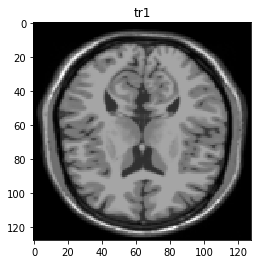

In [10]:
plt.title('tr1')
plt.imshow(sample_tr1.numpy()[:, :,0] * 0.5 + 0.5, cmap='gray')

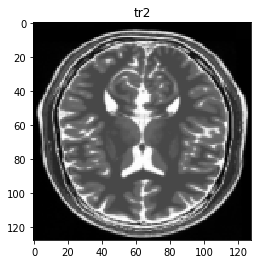

In [11]:
plt.title('tr2')
plt.imshow(sample_tr2.numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')

## Model Building & Training
The architecture of generator is a modified U-Net.

1.Create your Generator & Discriminator

2.Define the loss functions

3.Create the train_step function

In [12]:
class InstanceNormalization(tf.keras.layers.Layer):
    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon
    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)
    def call(self, x):
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    if apply_norm:
        result.add(InstanceNormalization())
    result.add(tf.keras.layers.LeakyReLU())
    return result

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    result.add(InstanceNormalization())
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    result.add(tf.keras.layers.ReLU())
    return result

### Unet Generator Model

In [13]:
def unet_generator():
    down_stack = [downsample(32*2**i,(3,3)) for i in range(1,6)]
    up_stack = [upsample(32*2**(3-i),(3,3)) for i in range(1,5)]
        
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(1, 3, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh') # (bs, 256, 256, 1)
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[None, None,1])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])
    
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

In [14]:
# Initializing the two generators

generator_g = unet_generator()#initialise the generator
generator_f = unet_generator()#initialise the generator

In [15]:
# Structure summary of the generator model

generator_g.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
sequential (Sequential)         (None, None, None, 6 704         input_1[0][0]                    
__________________________________________________________________________________________________
sequential_1 (Sequential)       (None, None, None, 1 73984       sequential[0][0]                 
__________________________________________________________________________________________________
sequential_2 (Sequential)       (None, None, None, 2 295424      sequential_1[0][0]               
______________________________________________________________________________________________

### CNN based Classifier, Discriminator model

In [16]:
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    inp = tf.keras.layers.Input(shape=[128, 128, 1], name='input_image')
    x = inp
    down1 = downsample(32*2,(3,3))(x)#write your code to downsample X
    down2 = downsample(32*4,(3,3))(down1)#write your code to downsample down1
    norm0 = InstanceNormalization()(down2)
    
    mp0 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(norm0)
    
    down3 = downsample(32*8,(3,3))(mp0)#write your code to downsample down2
    
    
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    
    conv = tf.keras.layers.Conv2D(512, 3, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1) # (bs, 31, 31, 512)
    leaky_relu = tf.keras.layers.LeakyReLU()(conv)
    norm1 = InstanceNormalization()(leaky_relu)
    
    mp1 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(norm1)
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(mp1) # (bs, 33, 33, 512)
    
    last = tf.keras.layers.Conv2D(1, 3, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)
    
    return tf.keras.Model(inputs=inp, outputs=last) #create the model using input & output layer

In [17]:
# Initializing the two discriminator models

discriminator_x = discriminator()#initialise the discriminator
discriminator_y = discriminator()#initialise the discriminator

In [18]:
# Disciminator model structure summary. The output shape of the last layer needs to be used as the size of patch for comparator array
discriminator_x.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_image (InputLayer)     [(None, 128, 128, 1)]     0         
_________________________________________________________________
sequential_18 (Sequential)   (None, 64, 64, 64)        704       
_________________________________________________________________
sequential_19 (Sequential)   (None, 32, 32, 128)       73984     
_________________________________________________________________
instance_normalization_20 (I (None, 32, 32, 128)       256       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 16, 16, 128)       0         
_________________________________________________________________
sequential_20 (Sequential)   (None, 8, 8, 256)         295424    
_________________________________________________________________
zero_padding2d (ZeroPadding2 (None, 10, 10, 256)       0   

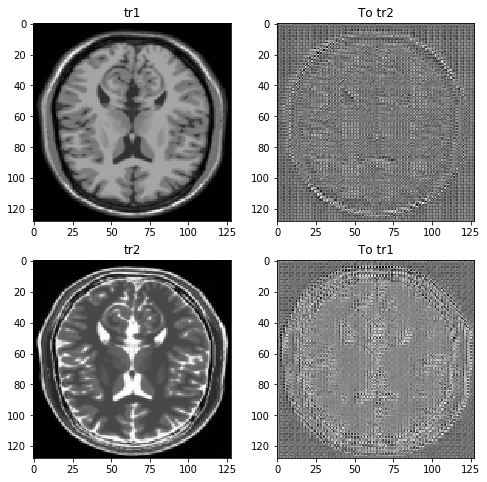

In [19]:
# Visualizing the output of untrained generator models

to_tr2 = generator_g(tr1)
to_tr1 = generator_f(tr2)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [tr1, to_tr2, tr2, to_tr1]
title = ['tr1', 'To tr2', 'tr2', 'To tr1']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    if i % 2 == 0:
        plt.imshow(imgs[i][0][:, :, 0] * 0.5 + 0.5, cmap='gray')
    else:
        plt.imshow(imgs[i][0][:, :, 0] * 0.5 * contrast + 0.5, cmap='gray')
plt.show()

In [20]:
# Factor of proportionality for cycle loss compared to generator loss in total generator loss

LAMBDA = 15 #"Your Lambda Value Here"

In [21]:
# Binary Cross Entropy function

loss_obj =tf.keras.losses.BinaryCrossentropy(
    from_logits=True)

#"Your Binary-Cross-Entropy Loss Here"

In [22]:
# Patch to make the size of comparison array same as output of discriminator

patch = (4, 4, 1)

In [23]:
# Discriminator loss function

def discriminator_loss(real, generated):
    
    valid = np.ones((real.shape[0],)+patch)
    fake = np.zeros((generated.shape[0],)+patch)
    
    # The discriminator loss for real image input obtained by comparing the outcome with value 1
    real_loss = loss_obj(valid,real) #write your code here
    
    # The discriminator loss for generated image input obtained by comparing the outcome with value 0
    generated_loss = loss_obj(fake,generated) #write your code here
    
    # Total loss disc loss is the average of real and generated image losses
    total_disc_loss = real_loss+generated_loss #write your code here
    
    return total_disc_loss * 0.5

In [24]:
# Generator loss function

def generator_loss(generated):
    valid = np.ones((generated.shape[0],)+patch)
    
    # The generator loss is computed by comparing discriminator output with 1
    
    loss = loss_obj(valid,generated)
    return loss

In [25]:
# Cycle loss function.Multiplied by lambda

def calc_cycle_loss(real_image, cycled_image):

    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))#write your code here
    return LAMBDA * loss1

In [26]:
# Identity loss function

def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image- same_image))
    return LAMBDA * 0.25 * loss

In [27]:
# Optimizers defined for the different models

generator_g_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-3)
generator_f_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-3)

discriminator_x_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-3)
discriminator_y_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-3)

In [28]:
EPOCHS = 200 #"Your Number of Epochs Here"
batch_size = 8 # The actual batch size would be 4*8 considering image augmentation in the training step

In [29]:
#"Your_path_to_a_Folder_to_Store_Trained_Models"
# Only the checkpoint of the latest two epochs were saved due to memory constrains
    
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
checkpoint_path = model_name 
ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=2)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')


# Another Checkpoint to save only the generator models.
model_name1 = 'model_init1' + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
if not os.path.exists(model_name1):
    os.mkdir(model_name1)
        
checkpoint_path1 = model_name1 
ckpt1 = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f)

ckpt_manager1 = tf.train.CheckpointManager(ckpt1, checkpoint_path1, max_to_keep=40)

In [31]:
# The last checkpoint from previous training session is restored for continued training

ckpt.restore('model_init_2021-01-0303_46_34.528069/ckpt-400')

In [33]:
# Fuction to visualize original generated and expected images together

def generate_images(model, test_input, expected_output):
    prediction = model(test_input)
    plt.figure(figsize=(10, 10))
    display_list = [test_input[0], prediction[0], expected_output[0]]
    title = ['Input Image', 'Predicted Image', 'Expected Image']
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i].numpy()[:, :, 0] * 0.5+ 0.5, cmap='gray')
        plt.axis('off')
    plt.show()

In [36]:
# Function for training the models 

@tf.function
def train_step(real_x, real_y):
    
    # Image augmentation by left_right flip and contrast variation. Data augmented four times
    
    image_flipr = tf.image.flip_left_right(real_x)
    image_ad_cont = tf.image.adjust_contrast(tf.concat([real_x,image_flipr],0), 8)
    
    real_x1 = tf.random.shuffle(tf.concat([real_x,image_flipr,image_ad_cont],0))
    
    image_flipr = tf.image.flip_left_right(real_y)
    image_ad_cont = tf.image.adjust_contrast(tf.concat([real_y,image_flipr],0), 8)
    
    real_y1 = tf.random.shuffle(tf.concat([real_y,image_flipr,image_ad_cont],0))
    
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X.
   
        fake_y = generator_g(real_x1)#write your code to generate images using Generator_g on real_x
        cycled_x = generator_f(fake_y)#write your code to generate images susiing Generator_f on fake_y
     
        
        fake_x = generator_f(real_y1)#write your code to generate images using Generator_f on real_y
        cycled_y = generator_g(fake_x)#write your code to generate images using Generator_g on fake_x
        
        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x1)#write your code to generate images using Generator_f on real_x
        same_y = generator_g(real_y1)#write your code to generate images using Generator_g on real_y
        
        disc_real_x = discriminator_x(real_x1)#write your code to discriminate images using Discriminator_x on real_x
        disc_real_y = discriminator_y(real_y1)#write your code to discriminate images using Discriminator_y on real_y
        
        disc_fake_x = discriminator_x(fake_x)#write your code to discriminate images using Discriminator_x on fake_x
        disc_fake_y = discriminator_y(fake_y)#write your code to discriminate images using Discriminator_y on fake_y
        
        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)# calculate the generator_loss for disc_fake_
        gen_f_loss = generator_loss(disc_fake_x)# calculate the generator_loss for disc_fake_X 
        
        
        total_cycle_loss = calc_cycle_loss(real_x1, cycled_x) + calc_cycle_loss(real_y1, cycled_y) #calculate the total cycle loss

        # Total generator loss = adversarial loss + cycle loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y1, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x1, same_x)
        
        
        disc_x_loss = discriminator_loss(disc_real_x,disc_fake_x)# calculate the discriminator_loss for disc_fake_x wrt disc_real_x
        disc_y_loss = discriminator_loss(disc_real_y,disc_fake_y)# calculate the discriminator_loss foor disc_fake_y wrt disc_real_y

    # Calculate the gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_weights) #write your code here
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_weights) #write your code here
    
    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_weights) #write your code here
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_weights) #write your code here
    
    # Apply the gradients to the optimizer
    #write your code here
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_weights))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_weights))
    
    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_weights))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_weights))
  
    


### The models were initially trained for 200 epochs and consecuently trained in steps of 100 epochs for a total 800 epochs

Epoch 0 started


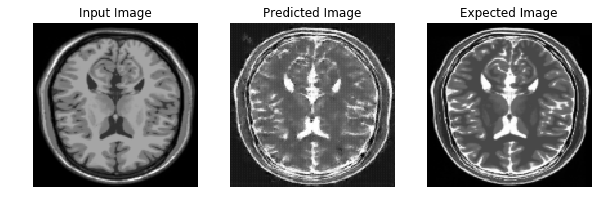

Saving checkpoint for epoch 0 at model_init_2021-01-0310_24_31.382482/ckpt-701
Epoch 1 started


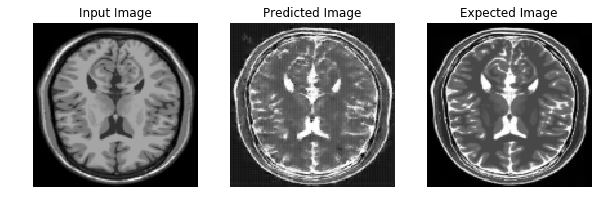

Saving checkpoint for epoch 1 at model_init_2021-01-0310_24_31.382482/ckpt-702
Epoch 2 started


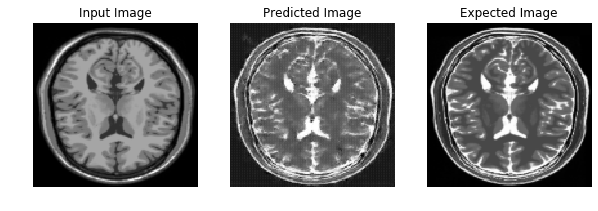

Saving checkpoint for epoch 2 at model_init_2021-01-0310_24_31.382482/ckpt-703
Epoch 3 started


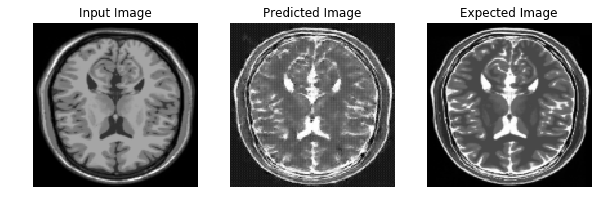

Saving checkpoint for epoch 3 at model_init_2021-01-0310_24_31.382482/ckpt-704
Epoch 4 started


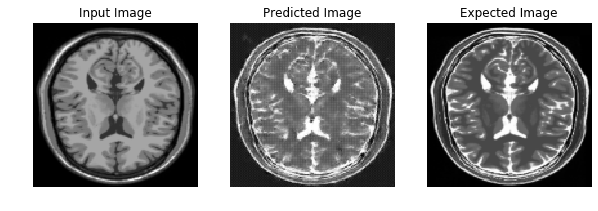

Saving checkpoint for epoch 4 at model_init_2021-01-0310_24_31.382482/ckpt-705
Epoch 5 started


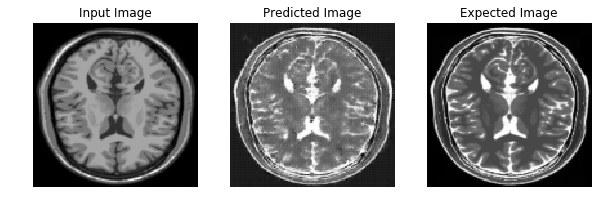

Saving checkpoint for epoch 5 at model_init_2021-01-0310_24_31.382482/ckpt-706
Epoch 6 started


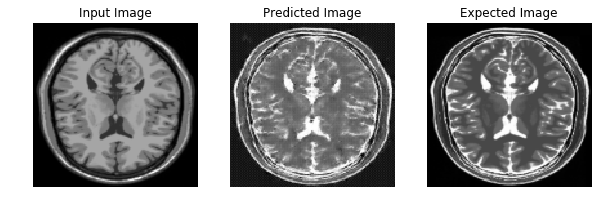

Saving checkpoint for epoch 6 at model_init_2021-01-0310_24_31.382482/ckpt-707
Epoch 7 started


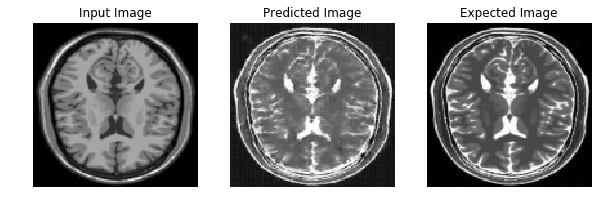

Saving checkpoint for epoch 7 at model_init_2021-01-0310_24_31.382482/ckpt-708
Epoch 8 started


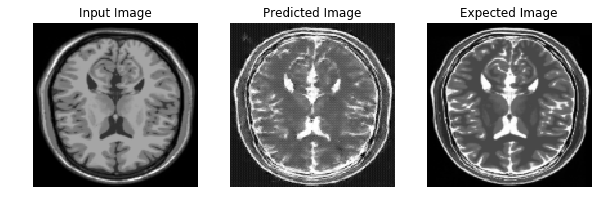

Saving checkpoint for epoch 8 at model_init_2021-01-0310_24_31.382482/ckpt-709
Epoch 9 started


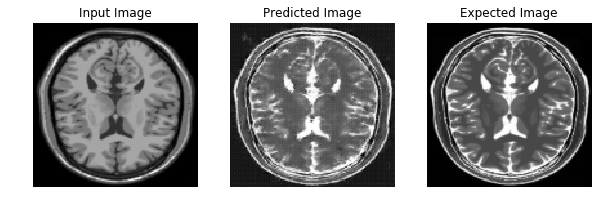

Saving checkpoint for epoch 9 at model_init_2021-01-0310_24_31.382482/ckpt-710
Epoch 10 started


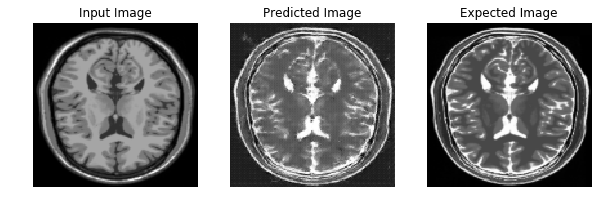

Saving checkpoint for epoch 10 at model_init_2021-01-0310_24_31.382482/ckpt-711
Epoch 11 started


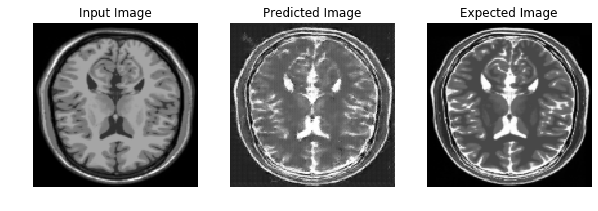

Saving checkpoint for epoch 11 at model_init_2021-01-0310_24_31.382482/ckpt-712
Epoch 12 started


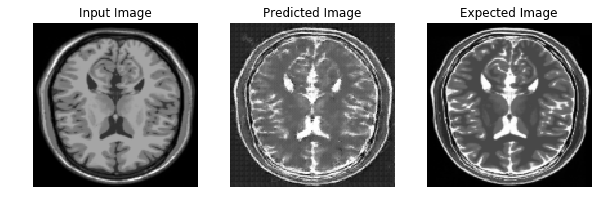

Saving checkpoint for epoch 12 at model_init_2021-01-0310_24_31.382482/ckpt-713
Epoch 13 started


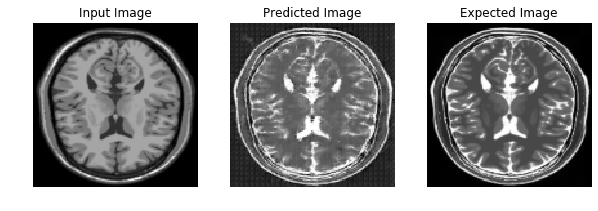

Saving checkpoint for epoch 13 at model_init_2021-01-0310_24_31.382482/ckpt-714
Epoch 14 started


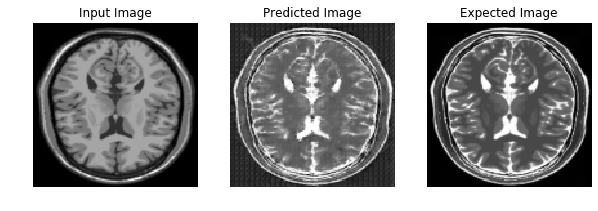

Saving checkpoint for epoch 14 at model_init_2021-01-0310_24_31.382482/ckpt-715
Epoch 15 started


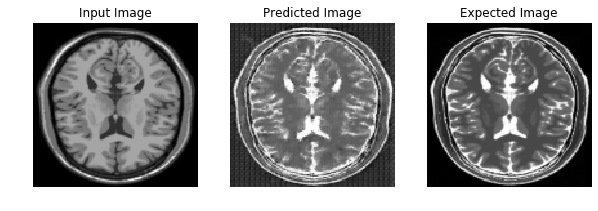

Saving checkpoint for epoch 15 at model_init_2021-01-0310_24_31.382482/ckpt-716
Epoch 16 started


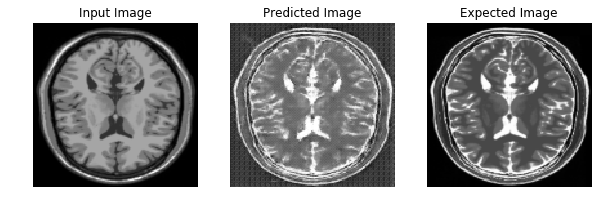

Saving checkpoint for epoch 16 at model_init_2021-01-0310_24_31.382482/ckpt-717
Epoch 17 started


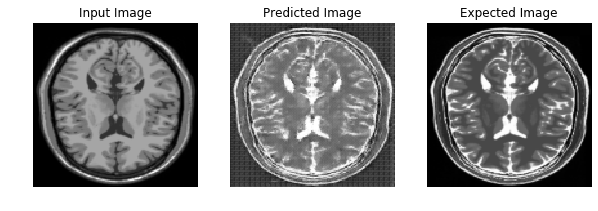

Saving checkpoint for epoch 17 at model_init_2021-01-0310_24_31.382482/ckpt-718
Epoch 18 started


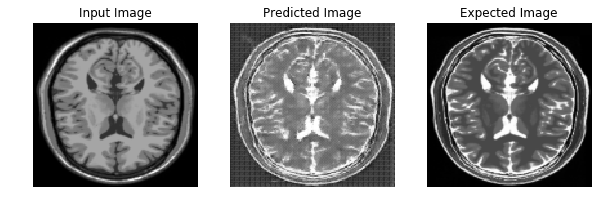

Saving checkpoint for epoch 18 at model_init_2021-01-0310_24_31.382482/ckpt-719
Epoch 19 started


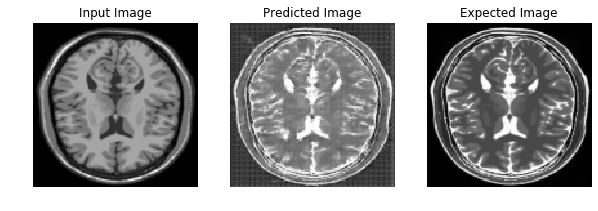

Saving checkpoint for epoch 19 at model_init_2021-01-0310_24_31.382482/ckpt-720
Epoch 20 started


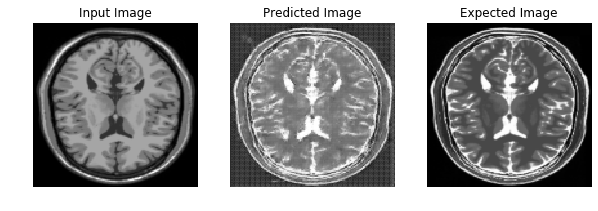

Saving checkpoint for epoch 20 at model_init_2021-01-0310_24_31.382482/ckpt-721
Epoch 21 started


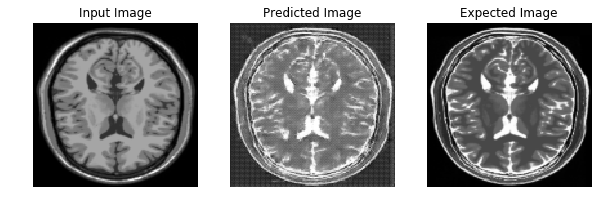

Saving checkpoint for epoch 21 at model_init_2021-01-0310_24_31.382482/ckpt-722
Epoch 22 started


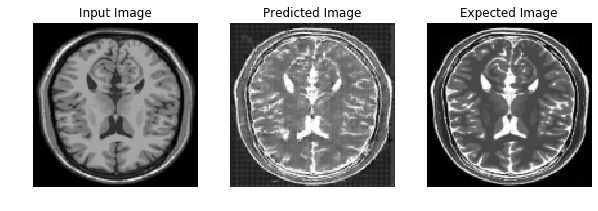

Saving checkpoint for epoch 22 at model_init_2021-01-0310_24_31.382482/ckpt-723
Epoch 23 started


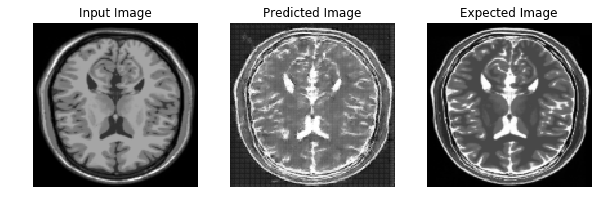

Saving checkpoint for epoch 23 at model_init_2021-01-0310_24_31.382482/ckpt-724
Epoch 24 started


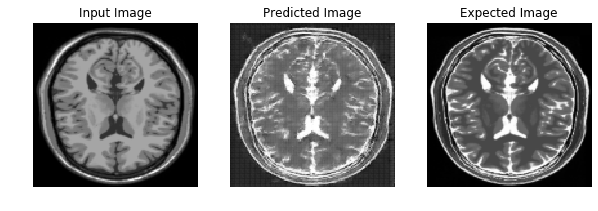

Saving checkpoint for epoch 24 at model_init_2021-01-0310_24_31.382482/ckpt-725
Epoch 25 started


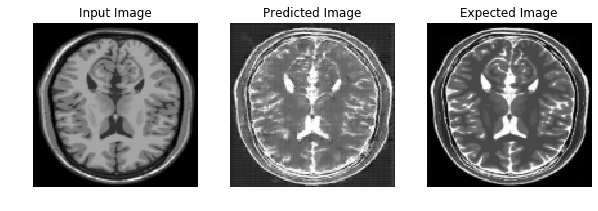

Saving checkpoint for epoch 25 at model_init_2021-01-0310_24_31.382482/ckpt-726
Epoch 26 started


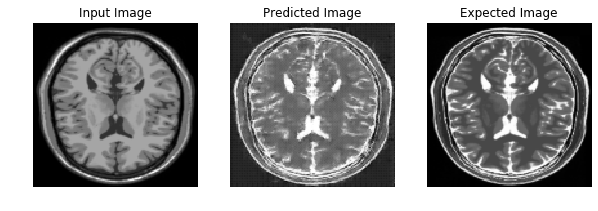

Saving checkpoint for epoch 26 at model_init_2021-01-0310_24_31.382482/ckpt-727
Epoch 27 started


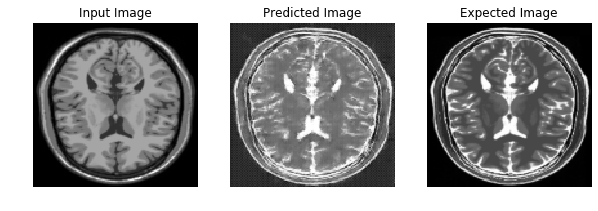

Saving checkpoint for epoch 27 at model_init_2021-01-0310_24_31.382482/ckpt-728
Epoch 28 started


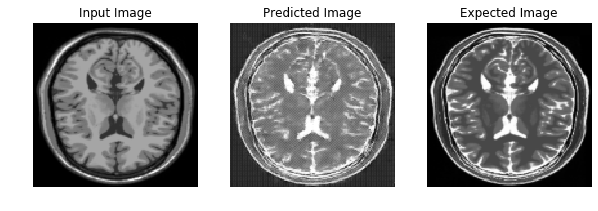

Saving checkpoint for epoch 28 at model_init_2021-01-0310_24_31.382482/ckpt-729
Epoch 29 started


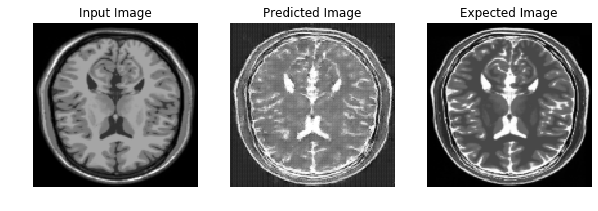

Saving checkpoint for epoch 29 at model_init_2021-01-0310_24_31.382482/ckpt-730
Epoch 30 started


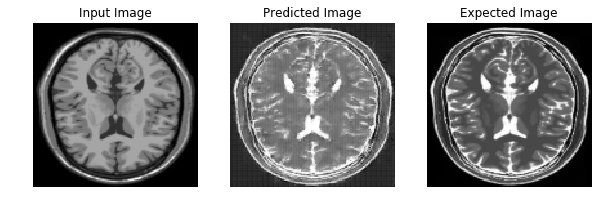

Saving checkpoint for epoch 30 at model_init_2021-01-0310_24_31.382482/ckpt-731
Epoch 31 started


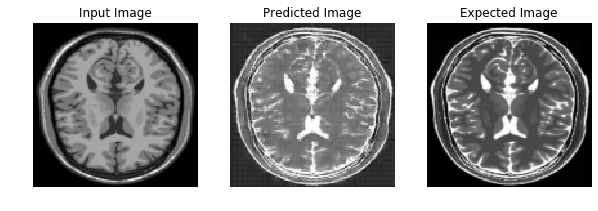

Saving checkpoint for epoch 31 at model_init_2021-01-0310_24_31.382482/ckpt-732
Epoch 32 started


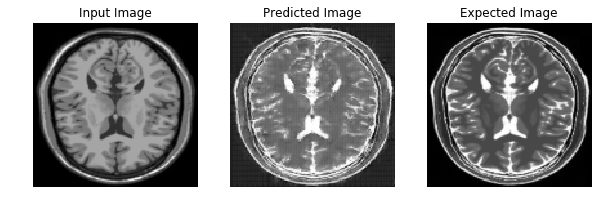

Saving checkpoint for epoch 32 at model_init_2021-01-0310_24_31.382482/ckpt-733
Epoch 33 started


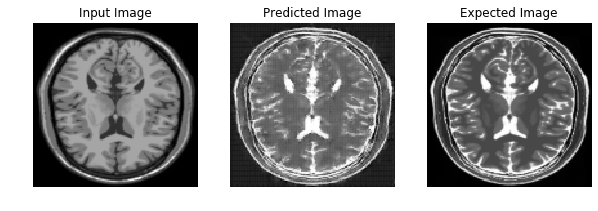

Saving checkpoint for epoch 33 at model_init_2021-01-0310_24_31.382482/ckpt-734
Epoch 34 started


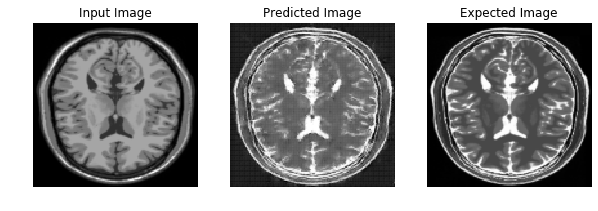

Saving checkpoint for epoch 34 at model_init_2021-01-0310_24_31.382482/ckpt-735
Epoch 35 started


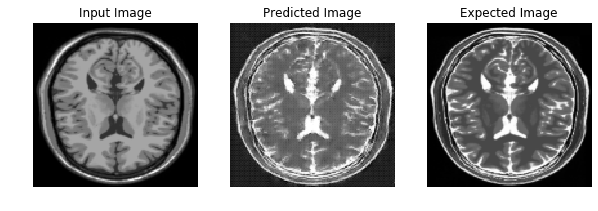

Saving checkpoint for epoch 35 at model_init_2021-01-0310_24_31.382482/ckpt-736
Epoch 36 started


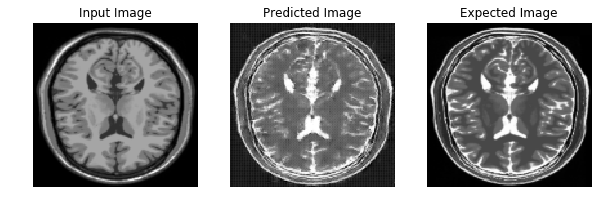

Saving checkpoint for epoch 36 at model_init_2021-01-0310_24_31.382482/ckpt-737
Epoch 37 started


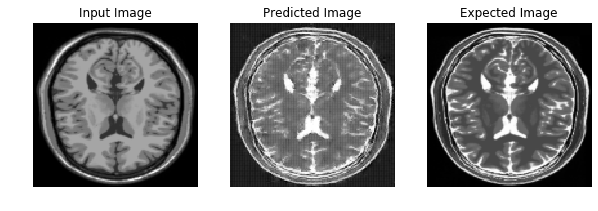

Saving checkpoint for epoch 37 at model_init_2021-01-0310_24_31.382482/ckpt-738
Epoch 38 started


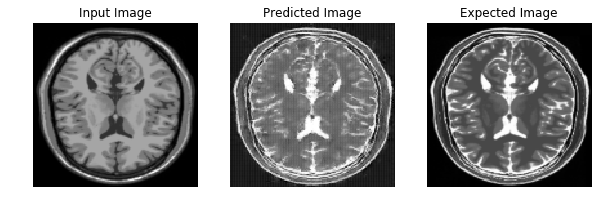

Saving checkpoint for epoch 38 at model_init_2021-01-0310_24_31.382482/ckpt-739
Epoch 39 started


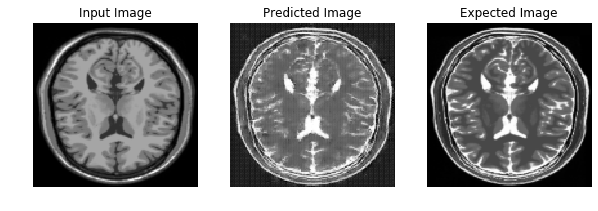

Saving checkpoint for epoch 39 at model_init_2021-01-0310_24_31.382482/ckpt-740
Epoch 40 started


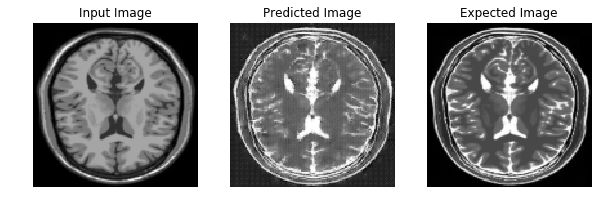

Saving checkpoint for epoch 40 at model_init_2021-01-0310_24_31.382482/ckpt-741
Epoch 41 started


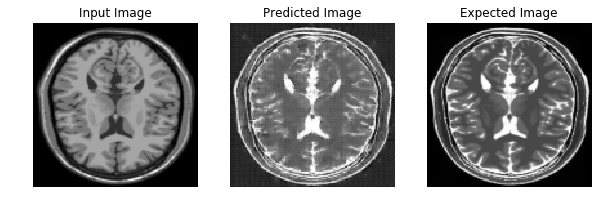

Saving checkpoint for epoch 41 at model_init_2021-01-0310_24_31.382482/ckpt-742
Epoch 42 started


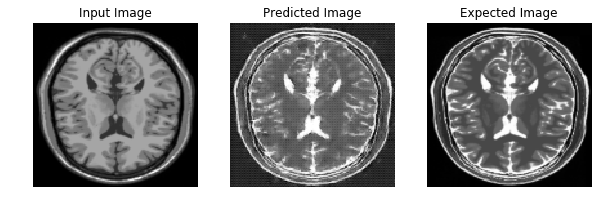

Saving checkpoint for epoch 42 at model_init_2021-01-0310_24_31.382482/ckpt-743
Epoch 43 started


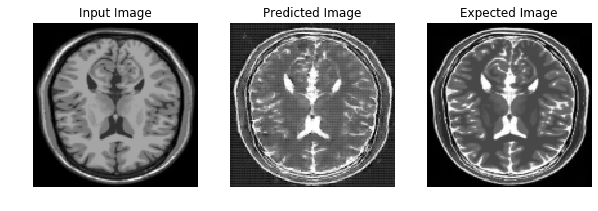

Saving checkpoint for epoch 43 at model_init_2021-01-0310_24_31.382482/ckpt-744
Epoch 44 started


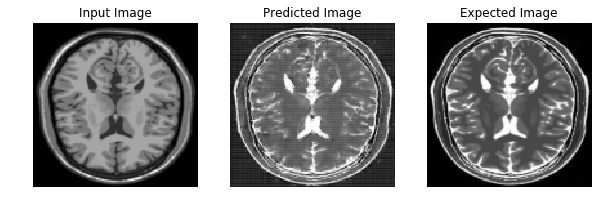

Saving checkpoint for epoch 44 at model_init_2021-01-0310_24_31.382482/ckpt-745
Epoch 45 started


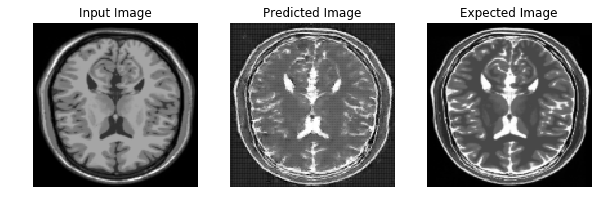

Saving checkpoint for epoch 45 at model_init_2021-01-0310_24_31.382482/ckpt-746
Epoch 46 started


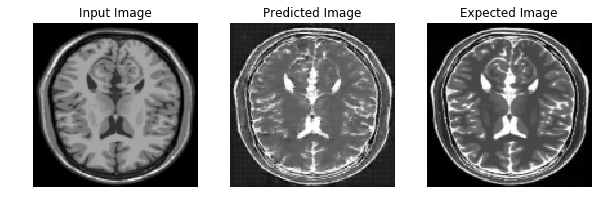

Saving checkpoint for epoch 46 at model_init_2021-01-0310_24_31.382482/ckpt-747
Epoch 47 started


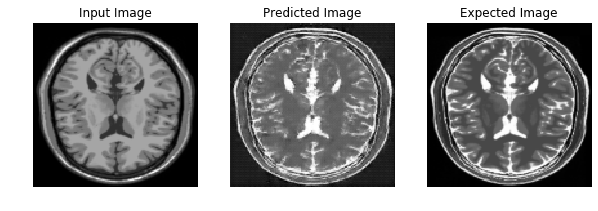

Saving checkpoint for epoch 47 at model_init_2021-01-0310_24_31.382482/ckpt-748
Epoch 48 started


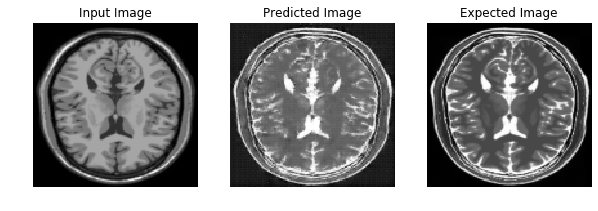

Saving checkpoint for epoch 48 at model_init_2021-01-0310_24_31.382482/ckpt-749
Epoch 49 started


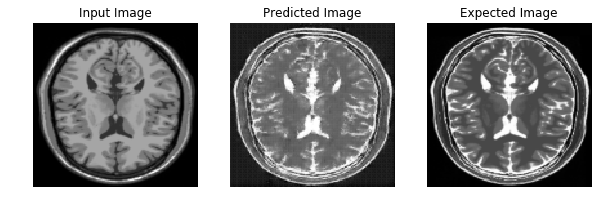

Saving checkpoint for epoch 49 at model_init_2021-01-0310_24_31.382482/ckpt-750
Epoch 50 started


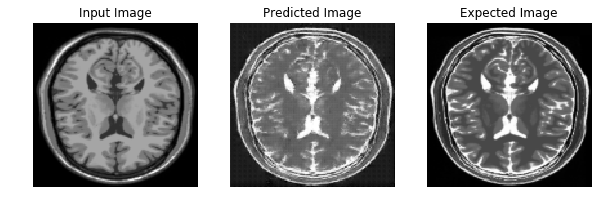

Saving checkpoint for epoch 50 at model_init_2021-01-0310_24_31.382482/ckpt-751
Epoch 51 started


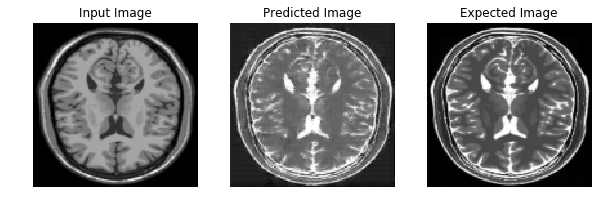

Saving checkpoint for epoch 51 at model_init_2021-01-0310_24_31.382482/ckpt-752
Epoch 52 started


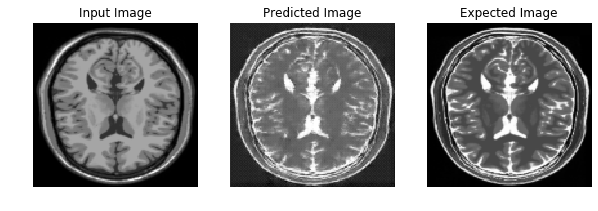

Saving checkpoint for epoch 52 at model_init_2021-01-0310_24_31.382482/ckpt-753
Epoch 53 started


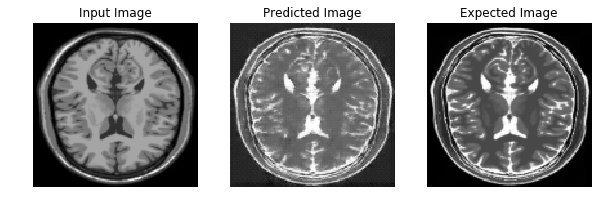

Saving checkpoint for epoch 53 at model_init_2021-01-0310_24_31.382482/ckpt-754
Epoch 54 started


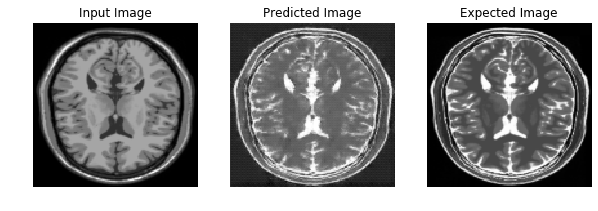

Saving checkpoint for epoch 54 at model_init_2021-01-0310_24_31.382482/ckpt-755
Epoch 55 started


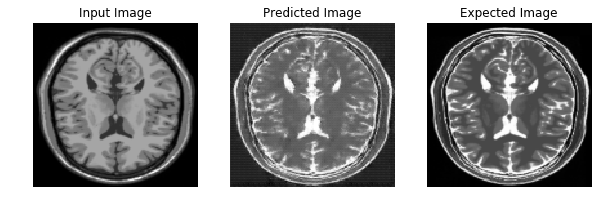

Saving checkpoint for epoch 55 at model_init_2021-01-0310_24_31.382482/ckpt-756
Epoch 56 started


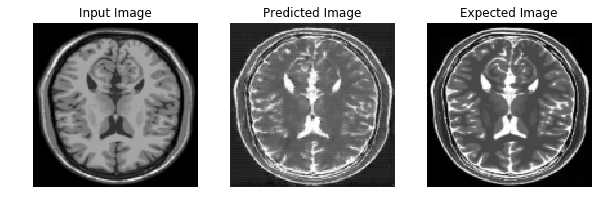

Saving checkpoint for epoch 56 at model_init_2021-01-0310_24_31.382482/ckpt-757
Epoch 57 started


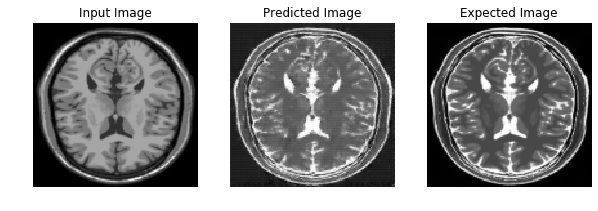

Saving checkpoint for epoch 57 at model_init_2021-01-0310_24_31.382482/ckpt-758
Epoch 58 started


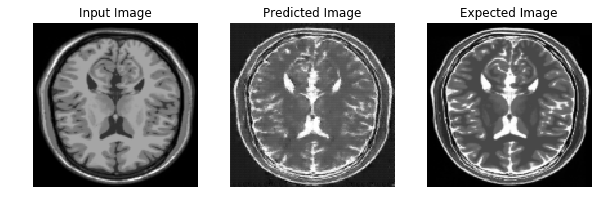

Saving checkpoint for epoch 58 at model_init_2021-01-0310_24_31.382482/ckpt-759
Epoch 59 started


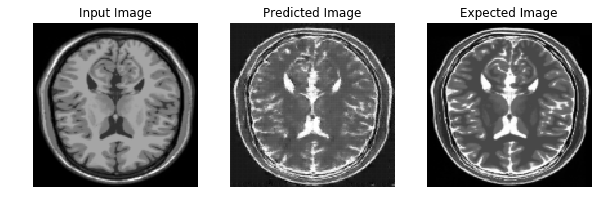

Saving checkpoint for epoch 59 at model_init_2021-01-0310_24_31.382482/ckpt-760
Epoch 60 started


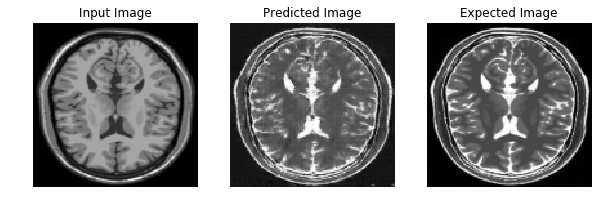

Saving checkpoint for epoch 60 at model_init_2021-01-0310_24_31.382482/ckpt-761
Epoch 61 started


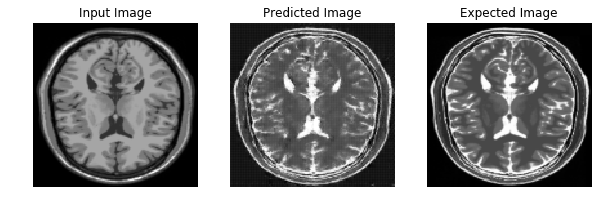

Saving checkpoint for epoch 61 at model_init_2021-01-0310_24_31.382482/ckpt-762
Epoch 62 started


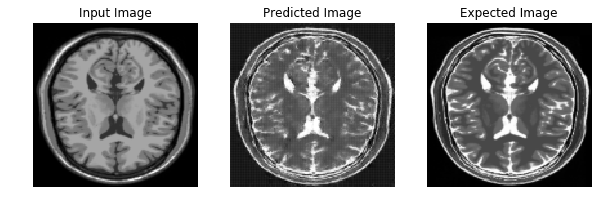

Saving checkpoint for epoch 62 at model_init_2021-01-0310_24_31.382482/ckpt-763
Epoch 63 started


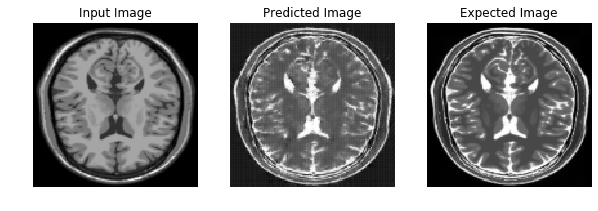

Saving checkpoint for epoch 63 at model_init_2021-01-0310_24_31.382482/ckpt-764
Epoch 64 started


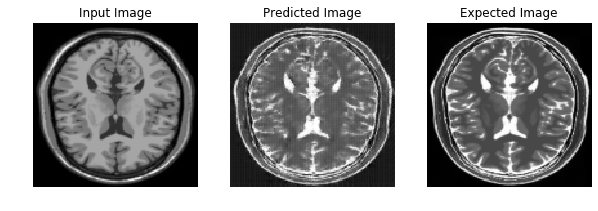

Saving checkpoint for epoch 64 at model_init_2021-01-0310_24_31.382482/ckpt-765
Epoch 65 started


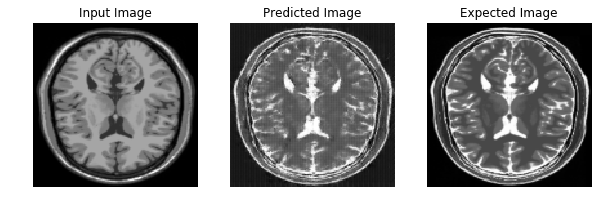

Saving checkpoint for epoch 65 at model_init_2021-01-0310_24_31.382482/ckpt-766
Epoch 66 started


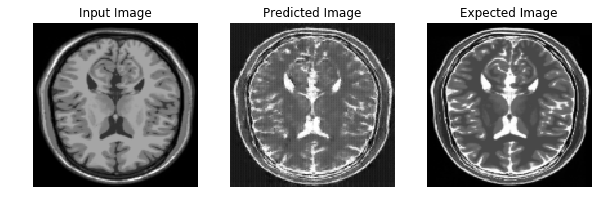

Saving checkpoint for epoch 66 at model_init_2021-01-0310_24_31.382482/ckpt-767
Epoch 67 started


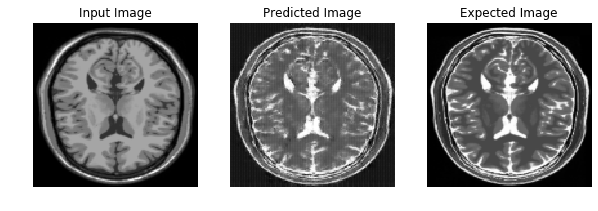

Saving checkpoint for epoch 67 at model_init_2021-01-0310_24_31.382482/ckpt-768
Epoch 68 started


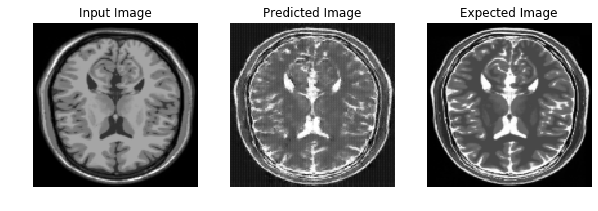

Saving checkpoint for epoch 68 at model_init_2021-01-0310_24_31.382482/ckpt-769
Epoch 69 started


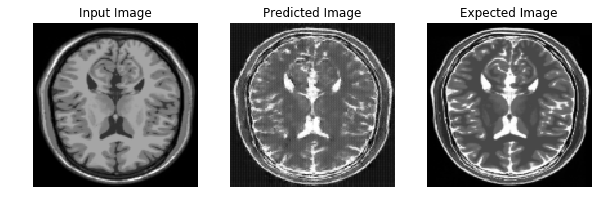

Saving checkpoint for epoch 69 at model_init_2021-01-0310_24_31.382482/ckpt-770
Epoch 70 started


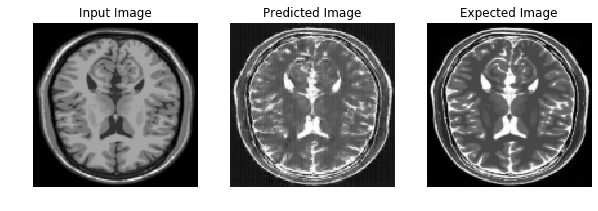

Saving checkpoint for epoch 70 at model_init_2021-01-0310_24_31.382482/ckpt-771
Epoch 71 started


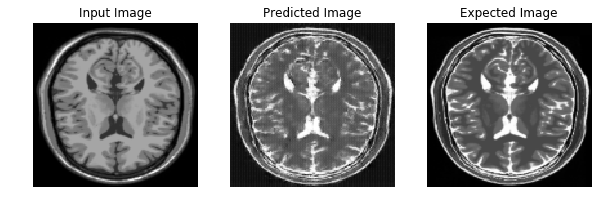

Saving checkpoint for epoch 71 at model_init_2021-01-0310_24_31.382482/ckpt-772
Epoch 72 started


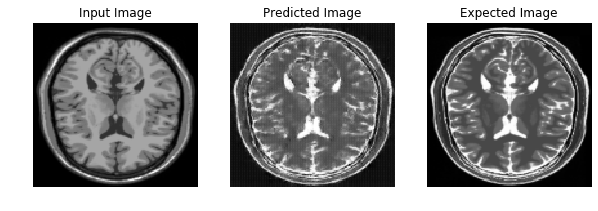

Saving checkpoint for epoch 72 at model_init_2021-01-0310_24_31.382482/ckpt-773
Epoch 73 started


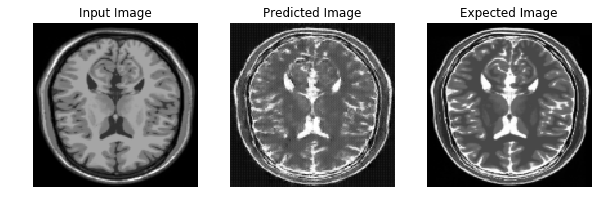

Saving checkpoint for epoch 73 at model_init_2021-01-0310_24_31.382482/ckpt-774
Epoch 74 started


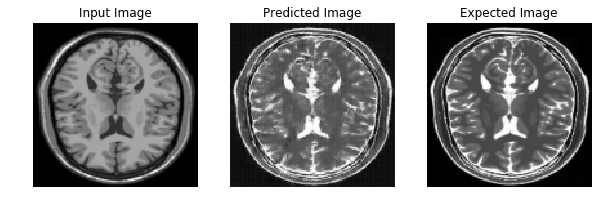

Saving checkpoint for epoch 74 at model_init_2021-01-0310_24_31.382482/ckpt-775
Epoch 75 started


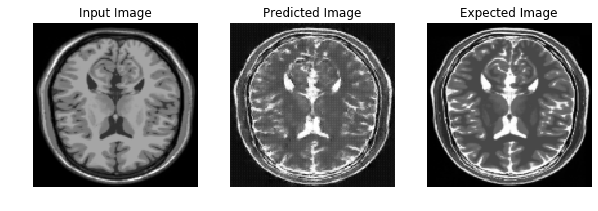

Saving checkpoint for epoch 75 at model_init_2021-01-0310_24_31.382482/ckpt-776
Epoch 76 started


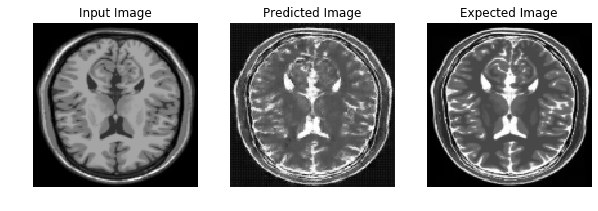

Saving checkpoint for epoch 76 at model_init_2021-01-0310_24_31.382482/ckpt-777
Epoch 77 started


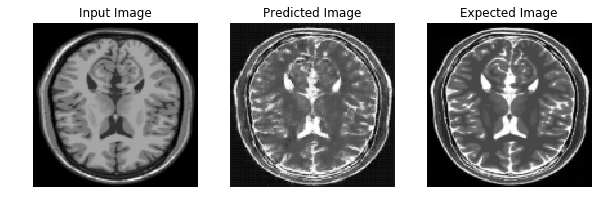

Saving checkpoint for epoch 77 at model_init_2021-01-0310_24_31.382482/ckpt-778
Epoch 78 started


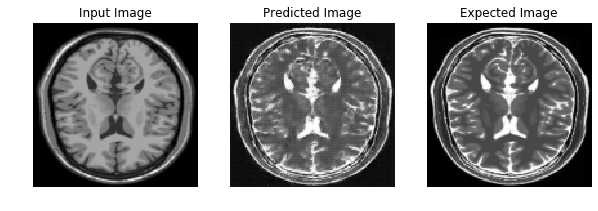

Saving checkpoint for epoch 78 at model_init_2021-01-0310_24_31.382482/ckpt-779
Epoch 79 started


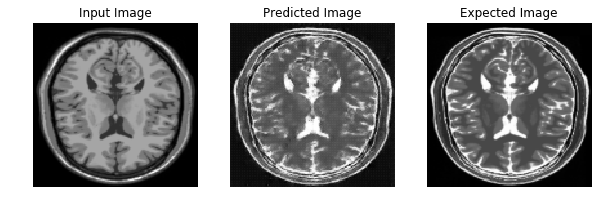

Saving checkpoint for epoch 79 at model_init_2021-01-0310_24_31.382482/ckpt-780
Epoch 80 started


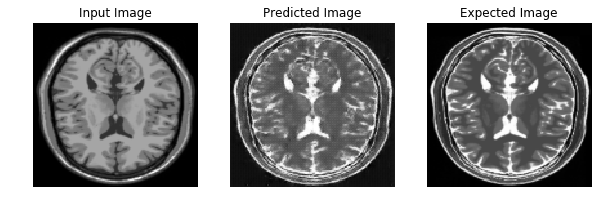

Saving checkpoint for epoch 80 at model_init_2021-01-0310_24_31.382482/ckpt-781
Epoch 81 started


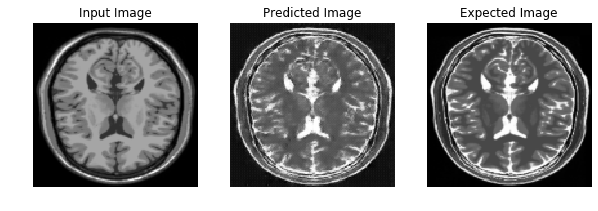

Saving checkpoint for epoch 81 at model_init_2021-01-0310_24_31.382482/ckpt-782
Epoch 82 started


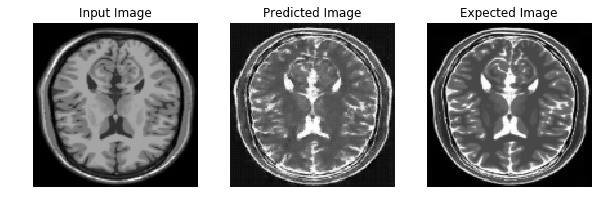

Saving checkpoint for epoch 82 at model_init_2021-01-0310_24_31.382482/ckpt-783
Epoch 83 started


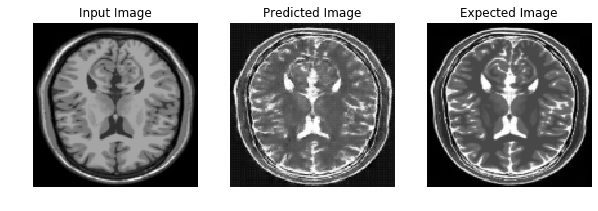

Saving checkpoint for epoch 83 at model_init_2021-01-0310_24_31.382482/ckpt-784
Epoch 84 started


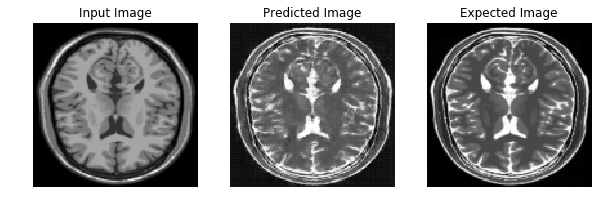

Saving checkpoint for epoch 84 at model_init_2021-01-0310_24_31.382482/ckpt-785
Epoch 85 started


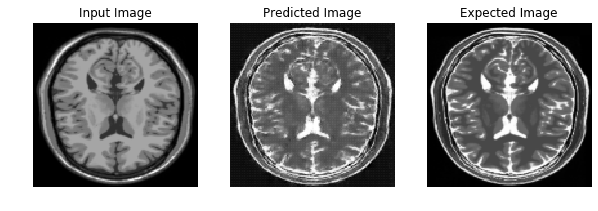

Saving checkpoint for epoch 85 at model_init_2021-01-0310_24_31.382482/ckpt-786
Epoch 86 started


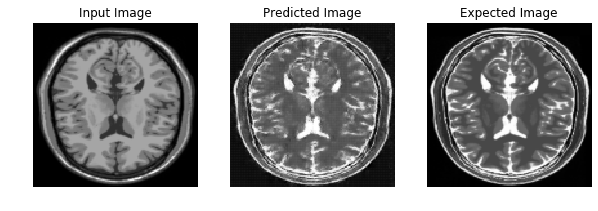

Saving checkpoint for epoch 86 at model_init_2021-01-0310_24_31.382482/ckpt-787
Epoch 87 started


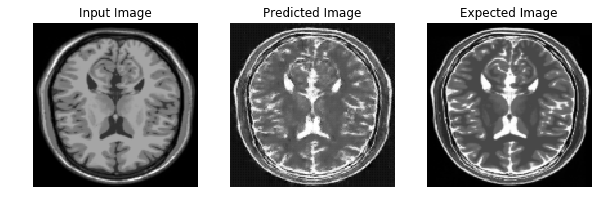

Saving checkpoint for epoch 87 at model_init_2021-01-0310_24_31.382482/ckpt-788
Epoch 88 started


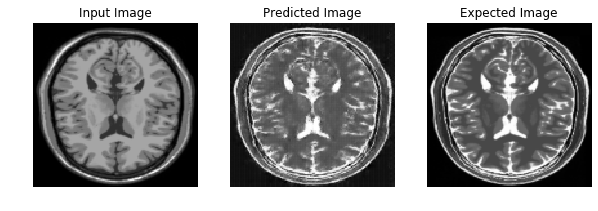

Saving checkpoint for epoch 88 at model_init_2021-01-0310_24_31.382482/ckpt-789
Epoch 89 started


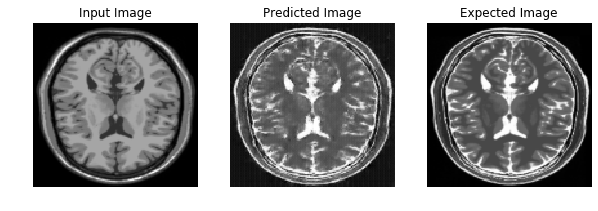

Saving checkpoint for epoch 89 at model_init_2021-01-0310_24_31.382482/ckpt-790
Epoch 90 started


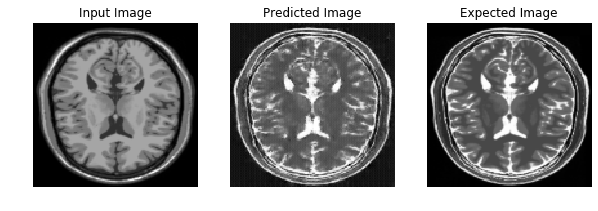

Saving checkpoint for epoch 90 at model_init_2021-01-0310_24_31.382482/ckpt-791
Epoch 91 started


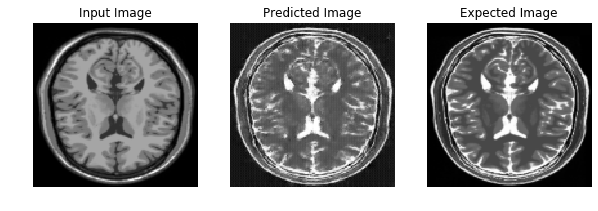

Saving checkpoint for epoch 91 at model_init_2021-01-0310_24_31.382482/ckpt-792
Epoch 92 started


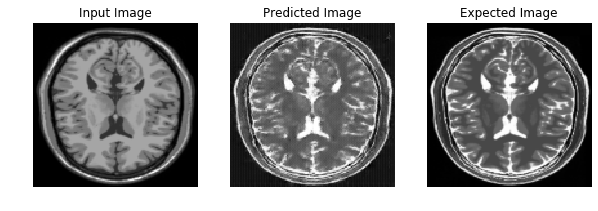

Saving checkpoint for epoch 92 at model_init_2021-01-0310_24_31.382482/ckpt-793
Epoch 93 started


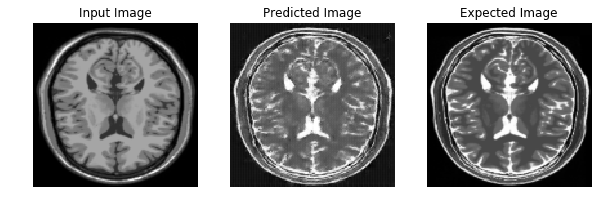

Saving checkpoint for epoch 93 at model_init_2021-01-0310_24_31.382482/ckpt-794
Epoch 94 started


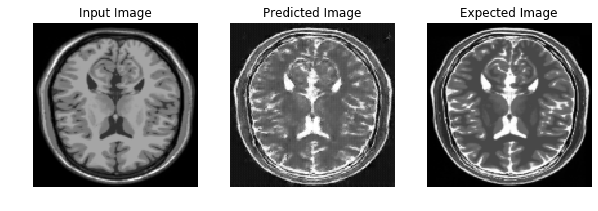

Saving checkpoint for epoch 94 at model_init_2021-01-0310_24_31.382482/ckpt-795
Epoch 95 started


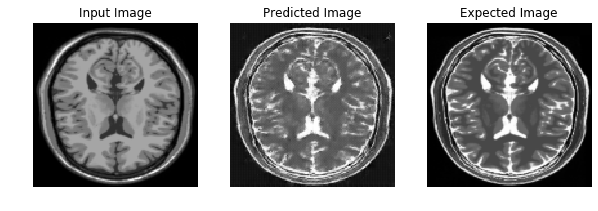

Saving checkpoint for epoch 95 at model_init_2021-01-0310_24_31.382482/ckpt-796
Epoch 96 started


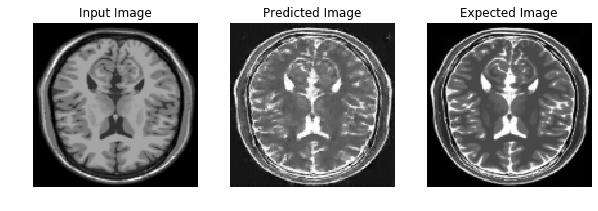

Saving checkpoint for epoch 96 at model_init_2021-01-0310_24_31.382482/ckpt-797
Epoch 97 started


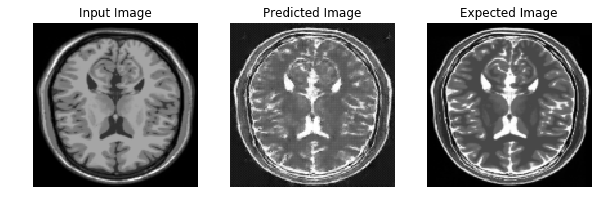

Saving checkpoint for epoch 97 at model_init_2021-01-0310_24_31.382482/ckpt-798
Epoch 98 started


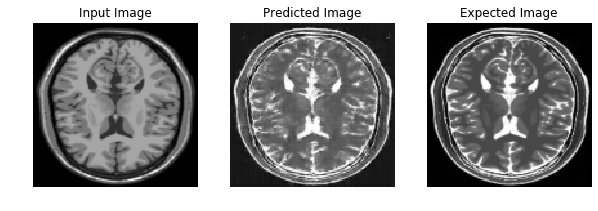

Saving checkpoint for epoch 98 at model_init_2021-01-0310_24_31.382482/ckpt-799
Epoch 99 started


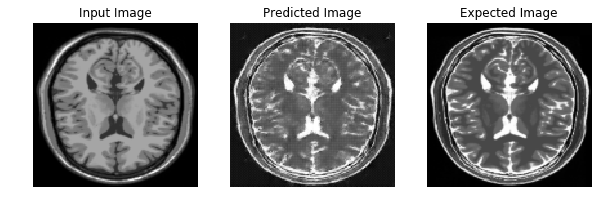

Saving checkpoint for epoch 99 at model_init_2021-01-0310_24_31.382482/ckpt-800


In [41]:
for epoch in range(100):
    
# Splitting the data into batches and feeding for training

    tr1_shuf = tf.random.shuffle(tr1)
    tr2_shuf = tf.random.shuffle(tr2)
    
    if len(file_list)%batch_size == 0:
        num_batches = len(file_list)//batch_size
    else:
        num_batches = 1 + len(file_list)//batch_size
    lis = []
    for i in range(num_batches):
        
        if i+1 < num_batches:
            lis.append(batch_size)
        elif batch_size==len(file_list):
            lis.append(batch_size)
        else:
            lis.append(len(file_list)%batch_size)
     
    tr1_s = tf.split(tr1_shuf, lis, axis=0)
    tr2_s = tf.split(tr2_shuf, lis, axis=0)
    
    print('Epoch', epoch, 'started')
    
    for i in range(len(lis)):
        image_x = tr1_s[i]
        image_y = tr2_s[i]
        train_step(image_x, image_y)
    generate_images(generator_g, tr1, tr2)
    ckpt_save_path = ckpt_manager.save()
    ckpt_manager1.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)

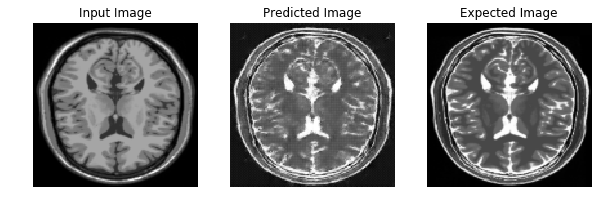

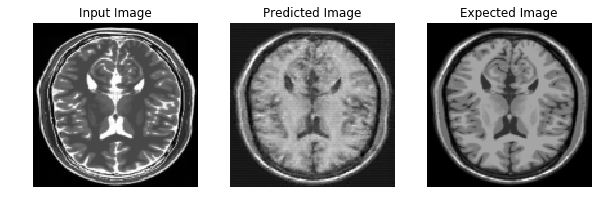

In [45]:
# Run the trained model on the test dataset

generate_images(generator_g, tr1, tr2)
generate_images(generator_f, tr2, tr1)

In [ ]:
# Run the trained model on the test dataset
for inp in tr1.take(5):
    generate_images(generator_g, inp, sample_tr2)